In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%%bash
git clone https://github.com/huggingface/diffusers
cd diffusers
pip install .
cd examples/kandinsky2_2/text_to_image
pip install -r requirements.txt

Processing /content/diffusers
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'
  Created wheel for diffusers: filename=diffusers-0.30.0.dev0-py3-none-any.whl size=2228484 sha256=2c8ba63ea1ab921409f6213774e7fdd6f39a7dc4d28725f9701843c74bc0029f
  Stored in directory: /tmp/pip-ephem-wheel-cache-bruimhva/wheels/95/c5/3b/e1b4269f8a2584de57e75f949a185b48fc4144e9a91fc9965a
Successfully built diffusers
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 309.4/309.4 kB 6.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 547.8/547.8 kB 10.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.4/54.4 kB 9.8 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.wh

Cloning into 'diffusers'...
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cudf-cu12 24.4.1 requires pyarrow<15.0.0a0,>=14.0.1, but you have pyarrow 16.1.0 which is incompatible.
google-colab 1.0.0 requires requests==2.31.0, but you have requests 2.32.3 which is incompatible.
ibis-framework 8.0.0 requires pyarrow<16,>=2, but you have pyarrow 16.1.0 which is incompatible.


In [ ]:
import os

from diffusers import KandinskyV22PriorPipeline, KandinskyV22Pipeline
import torch

import numpy as np

from tqdm import tqdm

from torch import nn

from PIL import Image
import matplotlib.pyplot as plt

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/diffusers/models/transformers/transformer_2d.py:34: FutureWarning: `Transformer2DModelOutput` is deprecated and will be removed in version 1.0.0. Importing `Transformer2DModelOutput` from `diffusers.models.transformer_2d` is deprecated and this will be removed in a future version. Please use `from diffusers.models.modeling_outputs import Transformer2DModelOutput`, instead.
  deprecate("Transformer2DModelOutput", "1.0.0", deprecation_message)


In [ ]:
prior_pipeline = KandinskyV22PriorPipeline.from_pretrained(
    "kandinsky-community/kandinsky-2-2-prior", torch_dtype=torch.float16).to("cuda")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/501 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/4.10G [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/2.78G [00:00<?, ?B/s]

image_encoder/config.json:   0%|          | 0.00/2.01k [00:00<?, ?B/s]

image_processor/preprocessor_config.json:   0%|          | 0.00/315 [00:00<?, ?B/s]

prior/config.json:   0%|          | 0.00/252 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/229 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/2.02k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/3.69G [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/862k [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/904 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

In [ ]:
pipeline = KandinskyV22Pipeline.from_pretrained(
    "kandinsky-community/kandinsky-2-2-decoder", torch_dtype=torch.float16).to("cuda")

model_index.json:   0%|          | 0.00/250 [00:00<?, ?B/s]

Fetching 6 files:   0%|          | 0/6 [00:00<?, ?it/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/271M [00:00<?, ?B/s]

movq/config.json:   0%|          | 0.00/660 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.67k [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/317 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/5.01G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/3 [00:00<?, ?it/s]

In [ ]:
class RegressionModel(nn.Module):
    def __init__(self, input_channels, output_channels):
        super().__init__()
        self.linear_regression = nn.Linear(in_features=input_channels,
                               out_features=output_channels)
        self.layer0 = 2**10 * 12
        self.layer1 = 2**10 * 10
        self.layer2 = 2**10 * 5
        self.layer3 = 2**10 * 2

        self.mlp = nn.Sequential(
            nn.Linear(in_features=input_channels,
                      out_features=self.layer0),
            nn.LeakyReLU(0.05, inplace=True),
            nn.Linear(in_features=self.layer0,
                      out_features=self.layer1),
            nn.LeakyReLU(0.05, inplace=True),
            nn.Linear(in_features=self.layer1,
                      out_features=self.layer2),
            nn.LeakyReLU(0.05, inplace=True),
            nn.Linear(in_features=self.layer2,
                      out_features=self.layer3),
            nn.LeakyReLU(0.05, inplace=True),
            nn.Linear(in_features=self.layer3,
                      out_features=output_channels),
        )


    def forward(self, x):
        return self.mlp(x)

input_dim = 15724
print('input_dim:', input_dim)
ouput_dim = 1280
print('output_dim:', ouput_dim)
model_embed = RegressionModel(input_dim, ouput_dim).cuda()

input_dim: 15724
output_dim: 1280


In [ ]:
# Укажите путь к вашему сохраненному файлу
best_model_path = '/content/drive/MyDrive/models/mlp_one_model.pth'

# Загрузите сохраненные параметры
checkpoint = torch.load(best_model_path)

# Загрузите параметры в соответствующие модели
model_embed.load_state_dict(checkpoint['model_embed_state_dict'])
print(checkpoint['min_test_loss'])

0.6651092022657394


In [ ]:
test_betas_path = '/content/drive/MyDrive/data/test_betas_split_sub1.npy'
test_caps_embed_path = '/content/drive/MyDrive/data/test_caps_embeds_split_sub1.npy'
test_caps_embed_neg_path = '/content/drive/MyDrive/data/test_caps_embeds_neg_split_sub1.npy'

test_betas = torch.from_numpy(np.load(test_betas_path)).float().cuda()
test_caps_embed = torch.from_numpy(np.load(test_caps_embed_path)).float().cuda()
test_caps_embed_neg = torch.from_numpy(np.load(test_caps_embed_neg_path)).float().cuda()

In [ ]:
train_cap_path = '/content/drive/MyDrive/data/nsd_train_cap_sub1.npy'
train_caps = np.load(train_cap_path)

test_cap_path = '/content/drive/MyDrive/data/nsd_test_cap_sub1.npy'
test_caps_all = np.load(test_cap_path)

n = len(test_caps_all) // 2
test_caps = test_caps_all[:n]

test_shift = len(train_caps)
test_shift

8859

In [ ]:
gen = torch.Generator()
gen.manual_seed(2147483647)

In [ ]:
negative_prompt = "low quality, bad quality"
height = 425
width = 425

save_path = '/content/drive/MyDrive/data/gen_test_images'

for index in range(len(test_betas)):
  image_gen = pipeline(
      image_embeds=model_embed(test_betas[index]).unsqueeze(0),
      negative_image_embeds=test_caps_embed_neg[index],
      height=height,
      width=width,
      num_inference_steps=50,
      generator=gen,
  ).images[0]
  print(image_gen.shape)
  print(np.array(image_gen).shape)
  break
  # image_gen.save(os.path.join(save_path, f'{index}.png'))

  0%|          | 0/50 [00:00<?, ?it/s]

(448, 448, 3)


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,


In [ ]:
print(image_gen.size)
print(np.array(image_gen).shape)

NameError: name 'image_gen' is not defined

In [ ]:
negative_prompt = "low quality, bad quality"
height = 425
width = 425

start = 0
end = 40

captions = list()
true_imgs = list()
gen_imgs = list()
cap_imgs = list()

for index in range(start, end):
  caps = [cap for cap in test_caps[index] if cap != '']
  cap = ','.join(caps)
  print(cap)

  gen.manual_seed(2147483647)
  image_true = pipeline(
      image_embeds=test_caps_embed[index],
      negative_image_embeds=test_caps_embed_neg[index],
      height=height,
      width=width,
      num_inference_steps=50,
      generator=gen,
  ).images[0]

  image_gen = pipeline(
      image_embeds=model_embed(test_betas[index]).unsqueeze(0),
      negative_image_embeds=test_caps_embed_neg[index],
      height=height,
      width=width,
      num_inference_steps=50,
      generator=gen,
  ).images[0]

  embed, negative_embed = prior_pipeline(
        prompt=cap,
        negative_prompt=negative_prompt,
        guidance_scale=1.0,
        generator=gen,
      ).to_tuple()

  image_cap = pipeline(
      image_embeds=embed,
      negative_image_embeds=negative_embed,
      height=height,
      width=width,
      num_inference_steps=50,
      generator=gen,
  ).images[0]

  captions.append('\n'.join(caps))
  true_imgs.append(image_true)
  gen_imgs.append(image_gen)
  cap_imgs.append(image_cap)

White cows eating grass under trees and the sky


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

There is a plane pulled into a port under the clouds.,An airplane sits at the airport waiting to be loaded.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

An aeroplane flying in the sky over the buildings at sunset.,An airplane flying in the air above a city.,an airplane flying about many tall buildings and cars 


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

A view of  a kitchen in the middle of day.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

a clock in the center of a tiled star pattern


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

three boats anchored to a boat dock on a body of water ,Multiple white boats in a harbor next to dock.,there are many boats docked in the water


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

There is a baseball game on and a player is at bat


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

A herd of giraffe standing around a dirt field.,There is no image on the screen to describe.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

there is a very large building that has a clock at the top of it


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

A bathroom is shown with black and white decor.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

a person is holding a remote with a blanket over them.,a person about to hit a button on a remote control


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The sink and mirror of a hotel room


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

An older gentleman riding a skate board through a course of orange cones.,A man riding a skateboard through orange cones.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

A striped cat laying on a wooden bench


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

A couple of people standing in a field flying a kite.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

A stop sign and a ferry sign share a pole on the beach,A Stop sign and other road signs at the beach near the sea,A stop sign on the beach with water in the background.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Man with red umbrella on tiled walk next to a plainly paved street.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

a gray and white cat sitting by a window,A cat sitting on a windowsill looking outside. 


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

a red vase with some roses in it


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

First person view of several motorcycles driving down a paved road.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

A picture filled with many things all inside.



  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

there are many different plates of food on this table,salad plate on a wooden table an soup in a bowl


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

A red Jeep is on the sand with some flying kites.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

two people riding snowboard on a snowy surface 


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Two wine glasses and a bottle on a counter. ,A counter top with glasses and bottles containing alcohol.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

An airplane from Korean Air is painted in blue.,there is a very large blue plane at this airport


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

A single zebra grazing in a grass field.,A zebra grazing on a grass field near the edge of a forest.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

A boy and a girl on a brown and green tennis court with rackets in their hands. 


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

A city street showing traffic at a stoplight intersection 


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Two plastic containers filled with food sitting on top of a table.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Men riding bikes through an intersection on a city street. 


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

a man shaking the hand of a man in a wheel chair 


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

A red two story bus drives down the street. ,A double red bus seems to be parked on the side. 


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

A pink tray has compartments with different foods in it.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

A commercial bathroom with a baby changing station,A clean bathroom with plenty of amenities including a diaper changing table.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

A yellow and white train pulling into a train station.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

some stools pans a potted plant a light and some shelves


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

a group of people standing around on the snow 


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The man is using his computer laying on his bed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

a clocks that's  on a wall that is falling down,A clock hangs from the wall of a beat up room,A clock on a dilapidated broken wall in a house


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

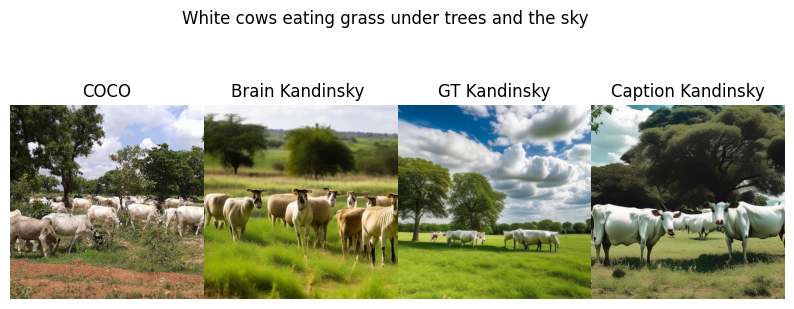

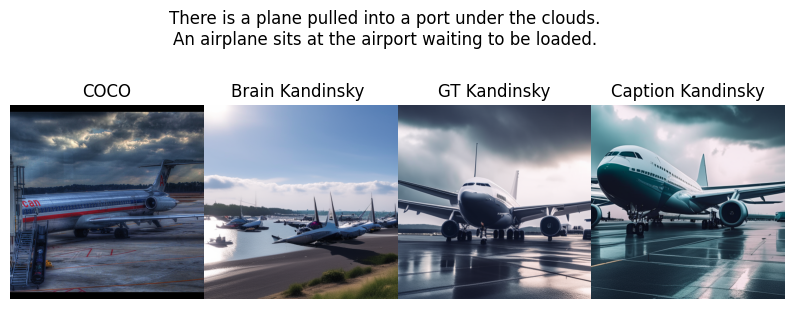

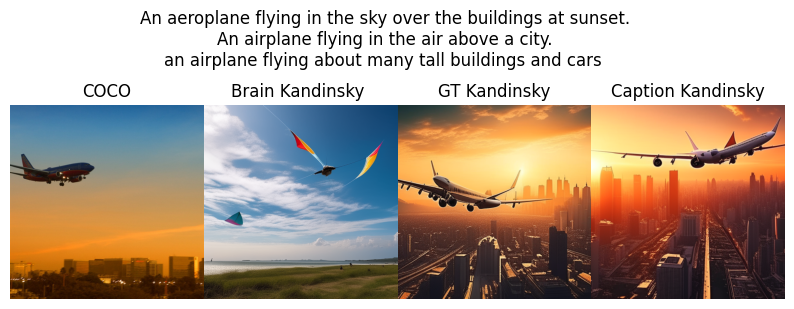

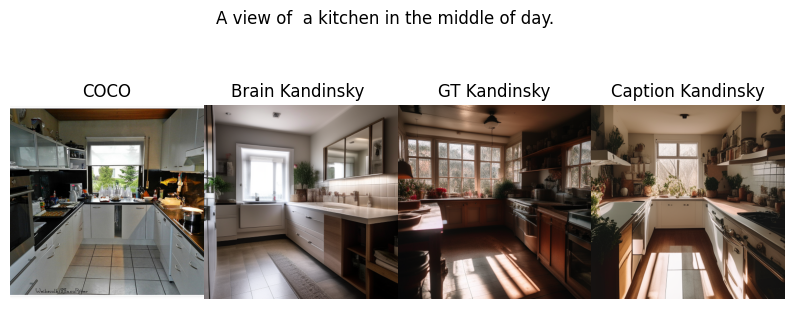

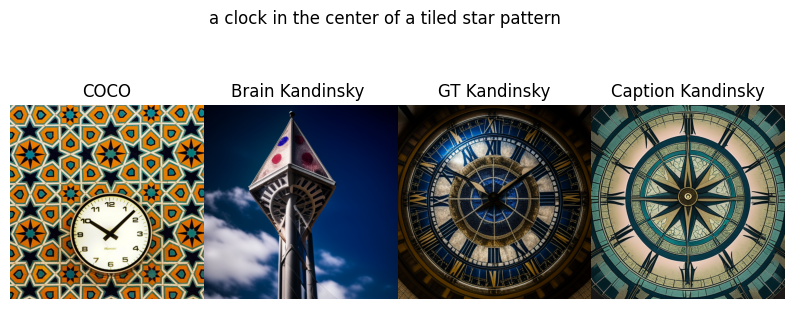

...

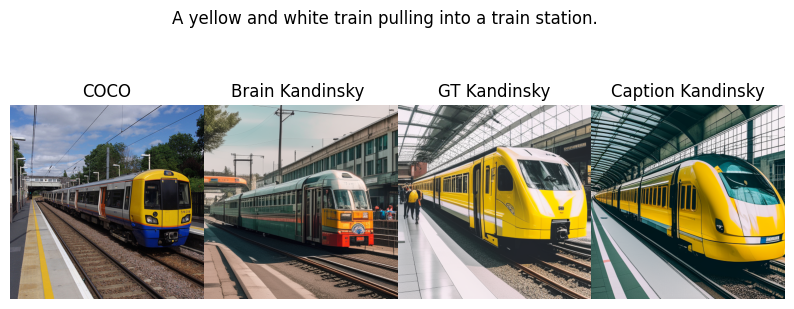

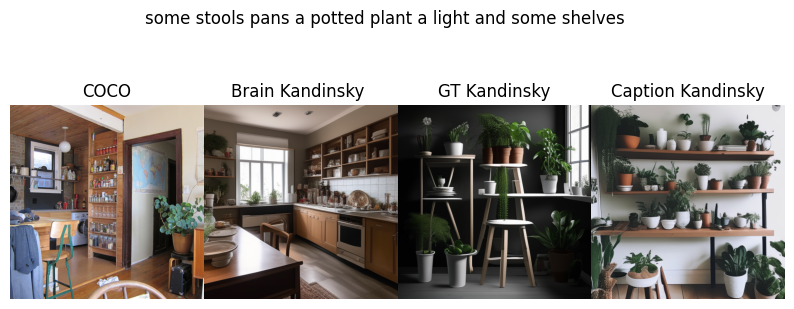

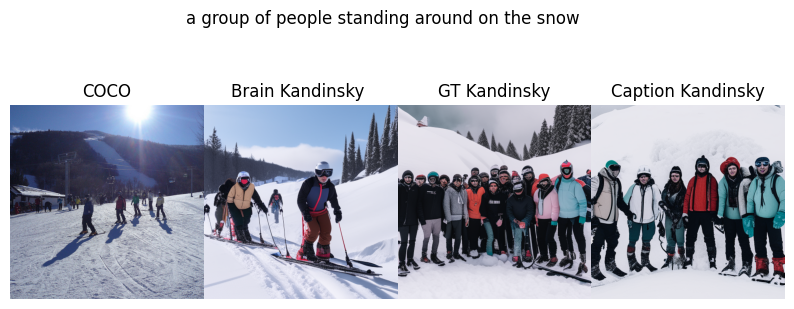

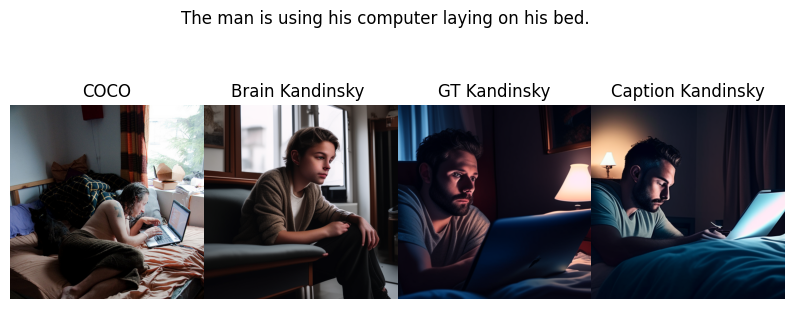

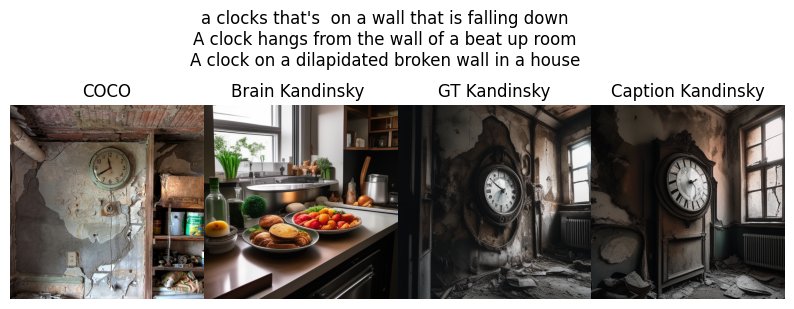

In [ ]:
for i, item in enumerate(range(start, end)):#len(true_imgs)):
  image_orig = np.load(f'/content/drive/MyDrive/data/imgs/{item}.npy')
  image_true = true_imgs[i]
  image_gen = gen_imgs[i]
  image_cap = cap_imgs[i]
  cap = captions[i]
  fig, ax = plt.subplots(1, 4, figsize=(10, 5))

  for axis in ax:
    axis.axis('off')
    axis.set_xticklabels([])
    axis.set_yticklabels([])
    axis.set_aspect('equal')


  ax[0].imshow(image_orig)
  ax[0].title.set_text('COCO')

  ax[1].imshow(image_gen)
  ax[1].title.set_text('Brain Kandinsky ')

  ax[2].imshow(image_true)
  ax[2].title.set_text('GT Kandinsky')

  ax[3].imshow(image_cap)
  ax[3].title.set_text('Caption Kandinsky')

  plt.subplots_adjust(wspace=0, hspace=0)
  plt.suptitle(cap, y=0.88)
  plt.savefig(f'/content/drive/MyDrive/data/comparison/{item}.png', bbox_inches='tight')
  plt.show()